In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

## Short Description
AP Windows were extracted from BiophysicalEssentials, a self-written GUI programm that currently is in development and allows to extract data, metadata, amplifier states from several binary file types such as .dat, .abf, .axon and more.

The Idea here was to use the shaped windows and retrieve information about the distingued AP shapes, and if those shapes are enough to build e.g. celltype classifier.
For this a collection of machine learning tools will be used, Dimensional Reduction, Clustering and Prediction.


In [ ]:
%ntbl pull datasets "APs"

Dataset files are being pulled ( this may take awhile )

Dataset files pulled from remote storage

In [ ]:
# have a look at the data
ap_shape = pd.read_csv("../datasets/APs/APShape.csv")
ap_shape

In [ ]:
ap_shape["sweep_exp"] = [f"{i}:{t}"for i,t in zip(ap_shape["experiment_name"], ap_shape["Sweep"])]
ap_shape

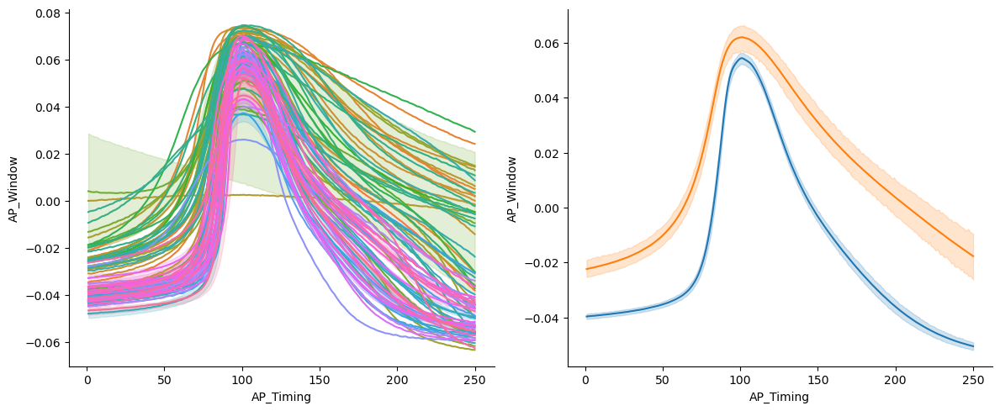

In [ ]:
fig, ax = plt.subplots(figsize = (12,5), ncols = 2)
sns.despine()
sns.lineplot(x = "AP_Timing", y = "AP_Window", data = ap_shape, hue = "experiment_name", legend = False, ax = ax[0])
sns.lineplot(x = "AP_Timing", y = "AP_Window", data = ap_shape, hue = "celltype", legend = False, ax = ax[1])
plt.tight_layout()


In [ ]:
# retrieve the funcitons
ap_shape_indeced = ap_shape.set_index("experiment_name")
# slice table to the selected features
ap_shape_selected = ap_shape_indeced[["AP_Window", "AP_Timing", "sweep_exp"]]

#groupby the timing as well as the sweep, this is important, it might be possible
# that more than one action potential is sliced from one experiment
grouped = pd.DataFrame(ap_shape_selected.groupby(["AP_Timing","sweep_exp"])["AP_Window"].agg("max"))
grouped_stacked = grouped.unstack()
grouped_stacked.columns = [i[1].split(":")[0] for i in grouped_stacked.columns]
grouped_stacked = grouped_stacked.T

In [ ]:
# Perform PCA after stakcing the data and transform the data into three components
pca = PCA(n_components = 3)
data = pd.DataFrame(pca.fit_transform(grouped_stacked.iloc[:,1:]), columns = ["PC1","PC2", "PC3"])
data["experiment_name"] =grouped_stacked.index
data_meta = pd.merge(data, ap_shape.iloc[:,6:], left_on = "experiment_name", right_on ="experiment_name", how = "left")

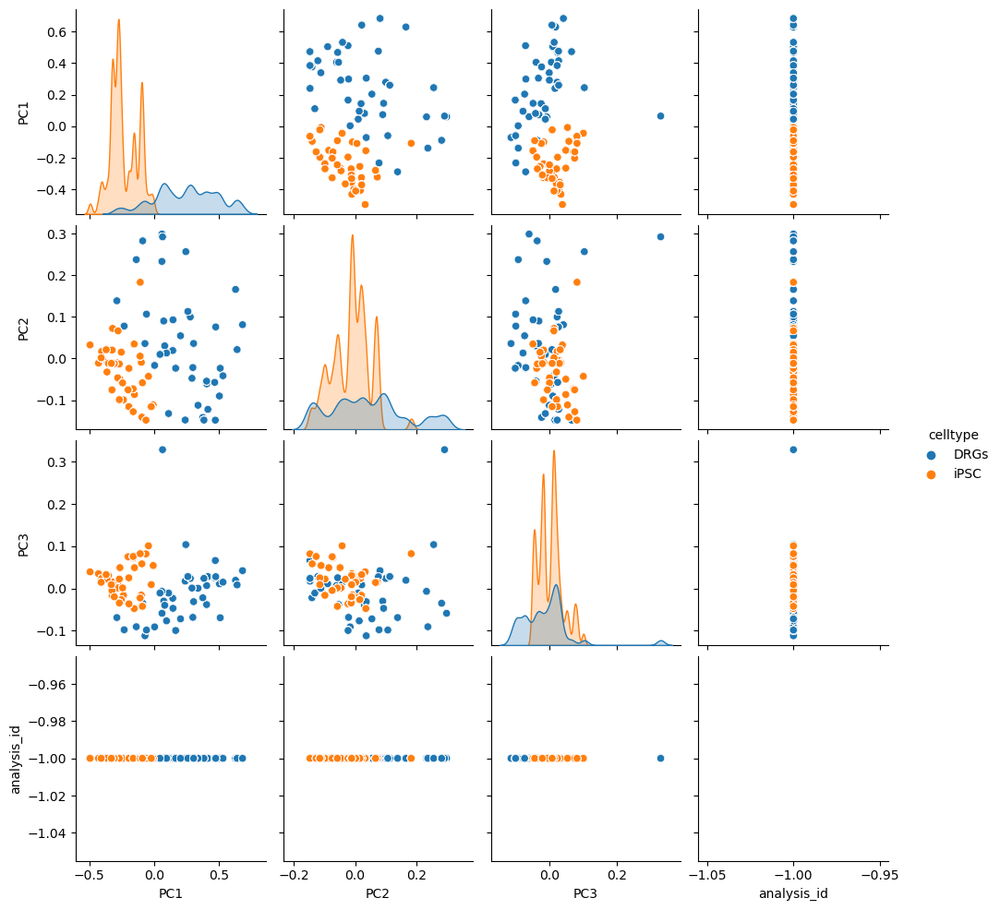

In [ ]:
# draws a pairplot to see how well the samples are splitting based on the waveform
sns.pairplot(data_meta, hue='celltype')